# **SELF-DRIVING CAR USING UDACITY’S CAR SIMULATOR ENVIRONMENT AND TRAINED BY DEEP NEURAL NETWORKS COMPLETE GUIDE**


**The Training Process**

We will now import all the libraries needed for training process. It will use Tensorflow backend and keras at frontend.

In [137]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.utils import shuffle
from imgaug import augmenters as iaa
from sklearn.model_selection import train_test_split
import cv2
import pandas as pd
import ntpath
import random
import warnings
warnings.filterwarnings("ignore")


We wil use datadir as the name given to the folder itself and take the parameters itself. Using head, we will show the first five values for the CSV on the desired format.

In [138]:
datadir = ''
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'data\driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\center_2025_07_22_23_07_08_522.jpg,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\left_2025_07_22_23_07_08_522.jpg,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\right_2025_07_22_23_07_08_522.jpg,0.0,0.0,0.0,0.000078
1,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\center_2025_07_22_23_07_08_623.jpg,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\left_2025_07_22_23_07_08_623.jpg,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\right_2025_07_22_23_07_08_623.jpg,0.0,0.0,0.0,0.000078
2,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\center_2025_07_22_23_07_08_725.jpg,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\left_2025_07_22_23_07_08_725.jpg,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\right_2025_07_22_23_07_08_725.jpg,0.0,0.0,0.0,0.000079
3,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\center_2025_07_22_23_07_08_827.jpg,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\left_2025_07_22_23_07_08_827.jpg,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\right_2025_07_22_23_07_08_827.jpg,0.0,0.0,0.0,0.000078
4,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\center_2025_07_22_23_07_08_931.jpg,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\left_2025_07_22_23_07_08_931.jpg,C:\Users\hussa\OneDrive\Desktop\Behavioral_Cloning\data\IMG\right_2025_07_22_23_07_08_931.jpg,0.0,0.0,0.0,0.000080


As this is picking up the entire path from the local machine, we need to use ntpath function to get the network path assigned. We will declare a name path_leaf and assign accordingly.

In [139]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2025_07_22_23_07_08_522.jpg,left_2025_07_22_23_07_08_522.jpg,right_2025_07_22_23_07_08_522.jpg,0.0,0.0,0.0,0.000078
1,center_2025_07_22_23_07_08_623.jpg,left_2025_07_22_23_07_08_623.jpg,right_2025_07_22_23_07_08_623.jpg,0.0,0.0,0.0,0.000078
2,center_2025_07_22_23_07_08_725.jpg,left_2025_07_22_23_07_08_725.jpg,right_2025_07_22_23_07_08_725.jpg,0.0,0.0,0.0,0.000079
3,center_2025_07_22_23_07_08_827.jpg,left_2025_07_22_23_07_08_827.jpg,right_2025_07_22_23_07_08_827.jpg,0.0,0.0,0.0,0.000078
4,center_2025_07_22_23_07_08_931.jpg,left_2025_07_22_23_07_08_931.jpg,right_2025_07_22_23_07_08_931.jpg,0.0,0.0,0.0,0.000080


We will bin the number of values where the number will be equal to 25 (odd number aimed to get center distribution). We will see the histogram using the np.histogram option on data frame ‘steering’, we will divide it to the number of bins.
We keep samples at 400 and then we draw a line. We see the data is centered along the middle that is 0.

In [140]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)

In [141]:
print(bins)

[-0.9035412  -0.82739955 -0.7512579  -0.67511626 -0.59897461 -0.52283296
 -0.44669131 -0.37054966 -0.29440802 -0.21826637 -0.14212472 -0.06598307
  0.01015858  0.08630022  0.16244187  0.23858352  0.31472517  0.39086682
  0.46700846  0.54315011  0.61929176  0.69543341  0.77157506  0.8477167
  0.92385835  1.        ]


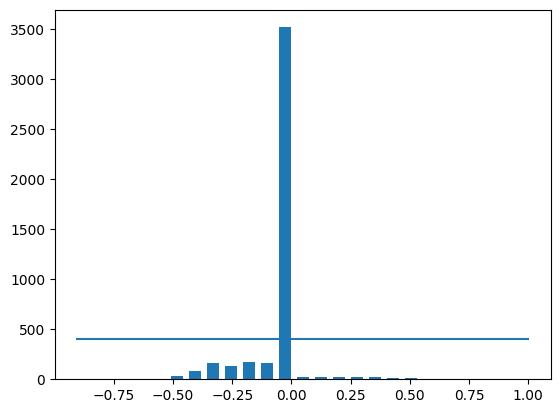

In [142]:
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), \
(samples_per_bin, samples_per_bin))

In [143]:
print('total data:', len(data))

total data: 4442


We wil specify a variable remove_list.We will specify samples we want to remove using looping construct through every single bin we will iterate through all the steering data. We will shuffle the data and romve some from it as it is now uniformly structured after shuffling.The output will be the distribution of steering angle that are much more uniform. There are significant amount of left steering angle and right steering angle eliminating the bias to drive straight all the time.

In [144]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)
print('removed:', len(remove_list))

removed: 3122


In [145]:
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

remaining: 1320


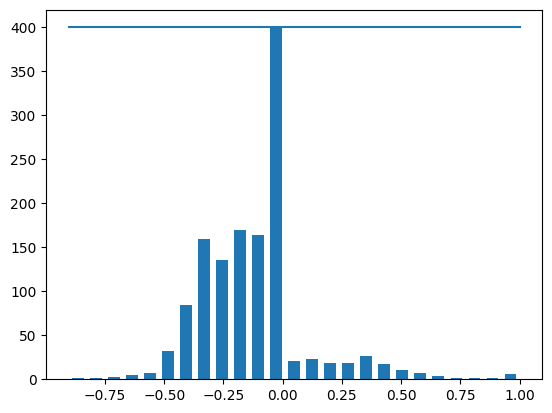

In [146]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), \
(samples_per_bin, samples_per_bin))

In [147]:
print(data.iloc[1])

center      center_2025_07_22_23_07_09_955.jpg
left        left_2025_07_22_23_07_09_955.jpg  
right       right_2025_07_22_23_07_09_955.jpg 
steering    0.0                               
throttle    0.819044                          
reverse     0.0                               
speed       1.401022                          
Name: 14, dtype: object


We will now load the image into array to manipulate them accordingly. We will define a function named locd_img_steering. We will have image path as empty list and steering as empty list and then loop through. We use iloc selector as data frame based on the specific index we will use cut data for now.

In [148]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings
 
image_paths, steerings = load_img_steering(datadir + 'data/IMG', data)

We will be splitting the image path as well as storing arrays accordingly.

In [149]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3168
Valid Samples: 792


We will have the histograms now.

Text(0.5, 1.0, 'Validation set')

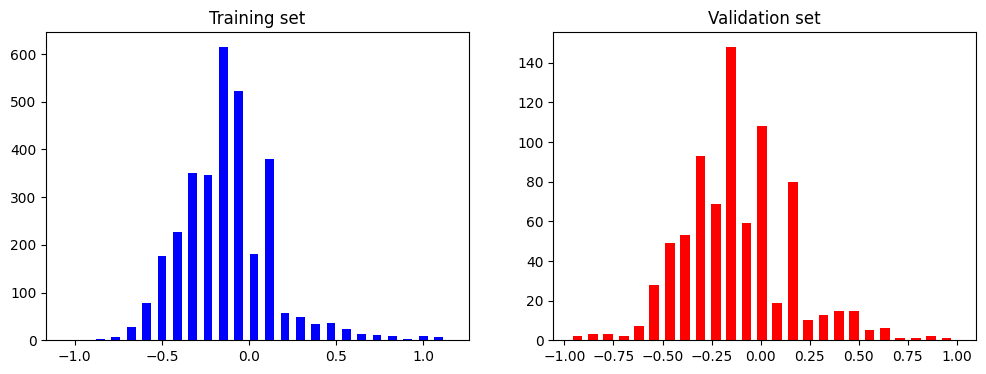

In [150]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

**Augmentation and image pre-processing**

The biggest challenge was generalizing the behavior of the car on Track_2 which it was never trained for. In a real-life situation, we can never train a self-driving car model for every track possible, as the data will be too huge to process. Also, it is not possible to gather the dataset for all the weather conditions and roads. Thus, there is a need to come up with an idea of generalizing the behavior on different tracks. This problem is solved using image preprocessing and augmentation techniques.

*Zoom*

The images in the dataset have relevant features in the lower part where the road is visible. The external environment above a certain image portion will never be used to determine the output and thus can be cropped. Approximately, 30% of the top portion of the image is cut and passed in the training set. The snippet of code and transformation of an image after cropping and resizing it to original image can be seen in below.

Text(0.5, 1.0, 'Zoomed Image')

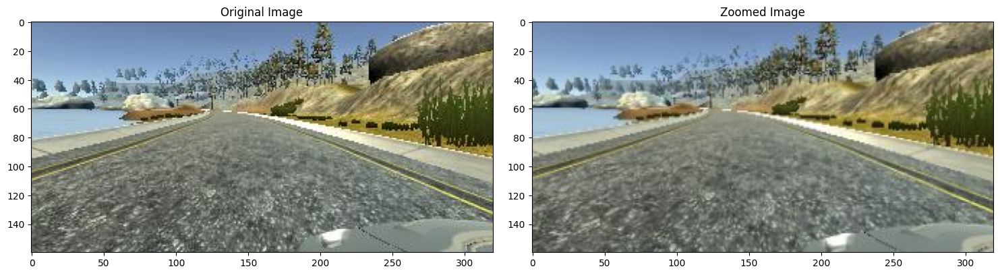

In [151]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

*Shift (horizontal/vertical)*

The image is shifted by a small amount, it is vertical shift and horizontal shift as below.

Text(0.5, 1.0, 'Panned Image')

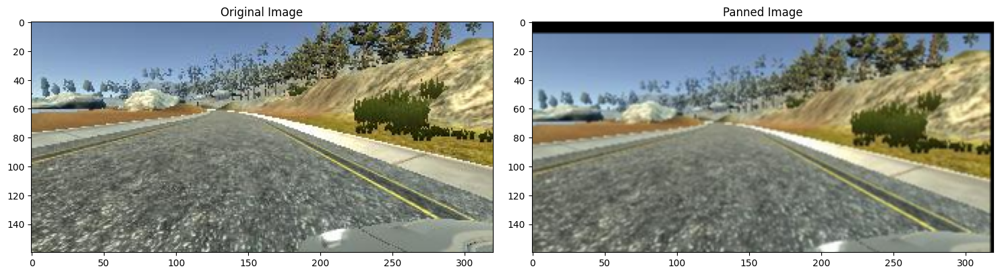

In [152]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

*Brightness*

To generalize to the weather conditions with bright sunny day or cloudy, lowlight conditions, the brightness augmentation can prove to be very useful. The code snippet and increase of brightness can be seen below. Similarly, I have randomly also lowered down the level of brightness for other conditions. 


Text(0.5, 1.0, 'Brightness altered image ')

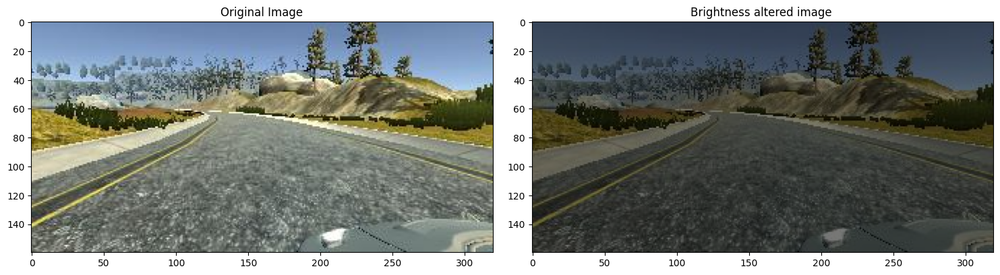

In [153]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

*Flip (horizontal)*

The image is flipped horizontally (i.e. a mirror image of the original image is passed to the dataset). The motive behind this is that the model gets trained for similar kinds of turns on opposite sides too. This is important because Track 1 includes only left turns. The snippet of code and transformation of an image after flipping it can be seen in below.

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.1447728')

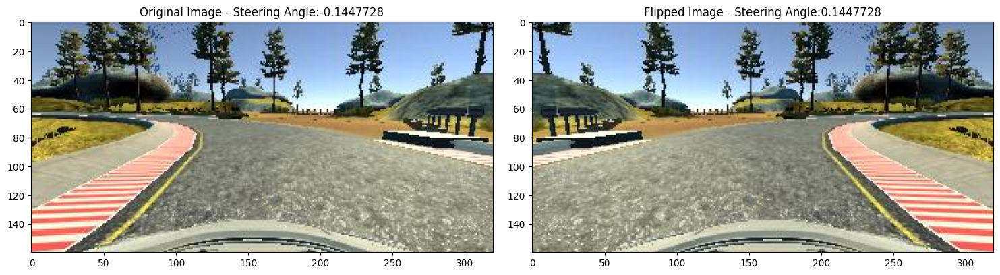

In [154]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
 
 
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

To have a look what we have at this moment

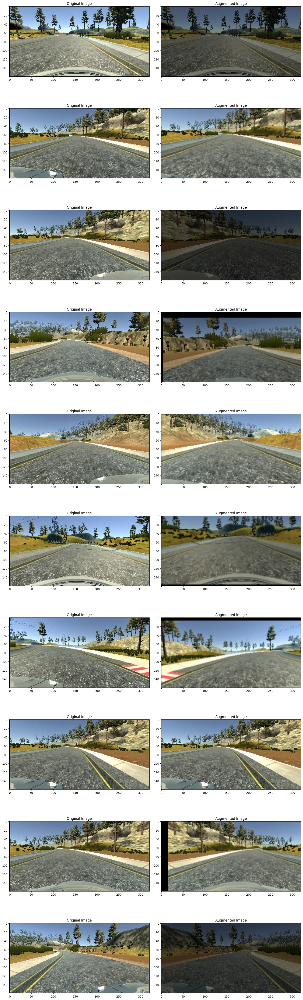

In [155]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    
    return image, steering_angle
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

I continued by doing some image processing. I cropped the image to remove the unnecessary features, changes the images to YUV format, used gaussian blur, decreased the size for easier processing and normalized the values

Text(0.5, 1.0, 'Preprocessed Image')

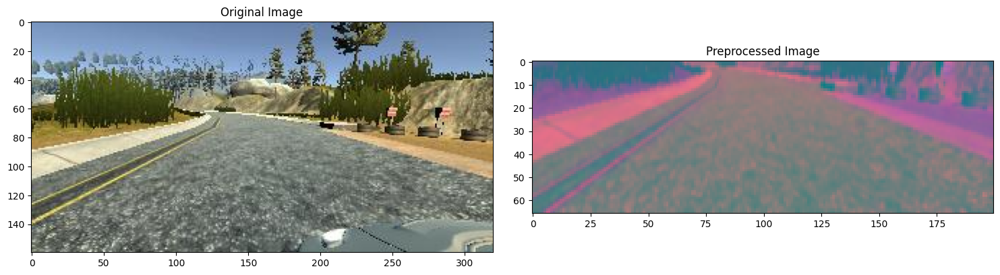

In [156]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

To compare and visualize I plotted the original and the pre-processed image.

Text(0.5, 1.0, 'Preprocessed Image')

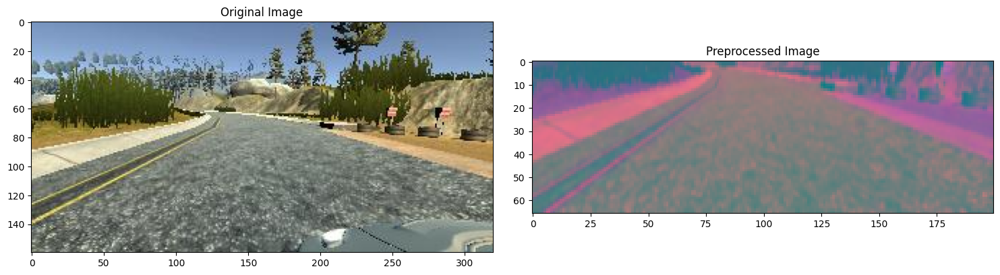

In [157]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [158]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
     
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering)) 

So far so good. Next, I converted all the images into numpy array.

Text(0.5, 1.0, 'Validation Image')

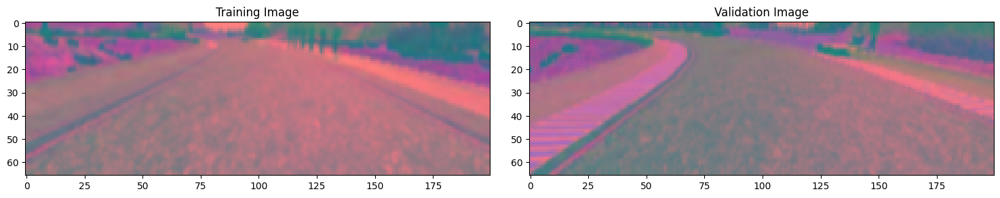

In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
 
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

We will design our Model architecture. We have to classify the traffic signs too that's why we need to shift from Lenet 5 model to NVDIA model. With behavioural cloning, our dataset is much more complex then any dataset we have used.
We are dealing with images that have (200,66) dimensions.
Our current datset has 5386 images to train with but MNSIT has around 60,000 images to train with.
Our behavioural cloning code has simply has to return appropriate steering angle which is a regression type example.
For these things, we need a more advanced model which is provided by nvdia and known as nvdia model.The architecture of nvdia model is as shown below:
![](http://miro.medium.com/max/4800/1*2Z_8DB1ybUmRaHUsyi6bSA.png)

For defining the model architecture, we need to define the model object.
Normalization state can be skipped as we have already normalized it.
We will add the convolution layer.
As compared to the model, we will organize accordingly.
The Nvdia model uses 24 filters in the layer along with a kernel of size 5,5.
We will introduce sub sampling. The function reflects to stride length of the kernel as it processes through an image, we have large images.
Horizontal movement with 2 pixels at a time, similarly vertical movement to 2 pixels at a time.
As this is the first layer, we have to define input shape of the model too i.e., (66,200,3) and the last function is an activation function that is “elu”.

Revisting the model, we see that our second layer has 36 filters with kernel size (5,5) same subsampling option with stride length of (2,2) and conclude this layer with activation ‘elu’.

According to Nvdia model, it shows we have 3 more layers in the convolutional neural network. With 48 filters, with 64 filters (3,3) kernel 64 filters (3,3) kernel Dimensions have been reduced significantly so for that we will remove subsampling from 4th and 5th layer.

Next we add a flatten layer. We will take the output array from previous convolution neural network to convert it into a one dimensional array so that it can be fed to fully connected layer to follow.

Our last convolution layer outputs an array shape of (1,18) by 64.

We end the architecture of Nvdia model with a dense layer containing a single output node which will output the predicted steering angle for our self driving car. Now we will use model.compile() to compile our architecture as this is a regression type example the metrics that we will be using will be mean squared error and optimize as Adam. We will be using relatively a low learning rate that it can help on accuracy. We will use dropout layer to avoid overfitting the data. Dropout Layer sets the input of random fraction of nodes to “0” during each update. During this, we will generate the training data as it is forced to use a variety of combination of nodes to learn from the same data. We will have to separate the convolution layer from fully connected layer with a factor of 0.5 is added so it converts 50 percent of the input to 0. We Will define the model by calling the nvdia model itself. Now we will have the model training process.To define training parameters, we will use model.fit(), we will import our training data X_Train, training data ->y_train, we have less data on the datasets we will require more epochs to be effective. We will use validation data and then use Batch size.

In [ ]:
class NvidiaModel(nn.Module):
    def __init__(self):
        super(NvidiaModel, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 24, kernel_size=5, stride=2),
            nn.ELU(),
            nn.Conv2d(24, 36, kernel_size=5, stride=2),
            nn.ELU(),
            nn.Conv2d(36, 48, kernel_size=5, stride=2),
            nn.ELU(),
            nn.Conv2d(48, 64, kernel_size=3),
            nn.ELU(),
            nn.Conv2d(64, 64, kernel_size=3),
            nn.ELU(),
            nn.Dropout(0.5),
            nn.Flatten(),
            nn.Linear(64 * 1 * 18, 100),  # Adjust according to your input size
            nn.ELU(),
            nn.Dropout(0.5),
            nn.Linear(100, 50),
            nn.ELU(),
            nn.Dropout(0.5),
            nn.Linear(50, 10),
            nn.ELU(),
            nn.Dropout(0.5),
            nn.Linear(10, 1)
        )

    def forward(self, x):
        return self.model(x)


In [161]:
from torchsummary import summary

model = NvidiaModel()
model.eval()

# For input shape (3, 66, 200)
summary(model, input_size=(3, 66, 200))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 24, 31, 98]           1,824
               ELU-2           [-1, 24, 31, 98]               0
            Conv2d-3           [-1, 36, 14, 47]          21,636
               ELU-4           [-1, 36, 14, 47]               0
            Conv2d-5            [-1, 48, 5, 22]          43,248
               ELU-6            [-1, 48, 5, 22]               0
            Conv2d-7            [-1, 64, 3, 20]          27,712
               ELU-8            [-1, 64, 3, 20]               0
            Conv2d-9            [-1, 64, 1, 18]          36,928
              ELU-10            [-1, 64, 1, 18]               0
          Dropout-11            [-1, 64, 1, 18]               0
          Flatten-12                 [-1, 1152]               0
           Linear-13                  [-1, 100]         115,300
              ELU-14                  [

**Results**

The following results were observed for described architectures. I had to come up with two different performance metrics.
- Value loss or Accuracy (computed during training phase)
- Generalization on Track 1 (drive performance)

**Value loss or Accuracy**

The primary evaluation metric used here is the loss observed over each epoch during training. In PyTorch, the validation loss for each epoch is typically computed by evaluating the model on a separate validation dataset after each training epoch. Initially, the loss is high in the early epochs, but it gradually decreases as the model learns from the training data. This trend can be observed in the training logs or plots, where the validation loss (val_loss) steadily declines over time, indicating that the model is improving its predictions during training.

In [162]:
from torch.utils.data import Dataset, DataLoader

class SteeringDataset(Dataset):
    def __init__(self, image_paths, steering_angles, is_training=True):
        self.image_paths = image_paths
        self.steering_angles = steering_angles
        self.is_training = is_training

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        angle = self.steering_angles[idx]

        if self.is_training:
            image, angle = random_augment(image_path, angle)
        else:
            image = mpimg.imread(image_path)

        image = img_preprocess(image)
        image = np.transpose(image, (2, 0, 1))  # Channels first
        return torch.tensor(image, dtype=torch.float32), torch.tensor(angle, dtype=torch.float32)



In [165]:
# Pass the full data, not one batch
train_dataset = SteeringDataset(X_train, y_train, is_training=True)
valid_dataset = SteeringDataset(X_valid, y_valid, is_training=False)

train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=100, shuffle=False)



In [166]:

import matplotlib.pyplot as plt
import torch
from tqdm import tqdm
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = NvidiaModel().to(device)

criterion = nn.MSELoss()  # Mean Squared Error for regression (steering angle)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


num_epochs = 100
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for images, steerings in tqdm(train_loader):
        images = images.to(device)
        steerings = steerings.to(device).view(-1, 1)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, steerings)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
    
    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, steerings in valid_loader:
            images = images.to(device)
            steerings = steerings.to(device).view(-1, 1)
            
            outputs = model(images)
            loss = criterion(outputs, steerings)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(valid_loader)
    val_losses.append(avg_val_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")


100%|██████████| 32/32 [00:23<00:00,  1.39it/s]


Epoch [1/100], Train Loss: 0.1196, Val Loss: 0.0730


100%|██████████| 32/32 [00:12<00:00,  2.57it/s]


Epoch [2/100], Train Loss: 0.0976, Val Loss: 0.0732


100%|██████████| 32/32 [00:12<00:00,  2.61it/s]


Epoch [3/100], Train Loss: 0.0976, Val Loss: 0.0736


100%|██████████| 32/32 [00:12<00:00,  2.59it/s]


Epoch [4/100], Train Loss: 0.0961, Val Loss: 0.0765


100%|██████████| 32/32 [00:13<00:00,  2.38it/s]


Epoch [5/100], Train Loss: 0.0956, Val Loss: 0.0740


100%|██████████| 32/32 [00:12<00:00,  2.49it/s]


Epoch [6/100], Train Loss: 0.0964, Val Loss: 0.0764


100%|██████████| 32/32 [00:12<00:00,  2.64it/s]


Epoch [7/100], Train Loss: 0.0937, Val Loss: 0.0804


100%|██████████| 32/32 [00:12<00:00,  2.66it/s]


Epoch [8/100], Train Loss: 0.0915, Val Loss: 0.0746


100%|██████████| 32/32 [00:11<00:00,  2.67it/s]


Epoch [9/100], Train Loss: 0.0935, Val Loss: 0.0768


100%|██████████| 32/32 [00:11<00:00,  2.67it/s]


Epoch [10/100], Train Loss: 0.0916, Val Loss: 0.0786


100%|██████████| 32/32 [00:12<00:00,  2.66it/s]


Epoch [11/100], Train Loss: 0.0898, Val Loss: 0.0731


100%|██████████| 32/32 [00:12<00:00,  2.52it/s]


Epoch [12/100], Train Loss: 0.0883, Val Loss: 0.0709


100%|██████████| 32/32 [00:11<00:00,  2.84it/s]


Epoch [13/100], Train Loss: 0.0850, Val Loss: 0.0684


100%|██████████| 32/32 [00:13<00:00,  2.43it/s]


Epoch [14/100], Train Loss: 0.0828, Val Loss: 0.0654


100%|██████████| 32/32 [00:17<00:00,  1.86it/s]


Epoch [15/100], Train Loss: 0.0835, Val Loss: 0.0645


100%|██████████| 32/32 [00:17<00:00,  1.81it/s]


Epoch [16/100], Train Loss: 0.0812, Val Loss: 0.0629


100%|██████████| 32/32 [00:14<00:00,  2.18it/s]


Epoch [17/100], Train Loss: 0.0808, Val Loss: 0.0595


100%|██████████| 32/32 [00:11<00:00,  2.67it/s]


Epoch [18/100], Train Loss: 0.0777, Val Loss: 0.0580


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [19/100], Train Loss: 0.0783, Val Loss: 0.0560


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [20/100], Train Loss: 0.0760, Val Loss: 0.0540


100%|██████████| 32/32 [00:11<00:00,  2.75it/s]


Epoch [21/100], Train Loss: 0.0754, Val Loss: 0.0538


100%|██████████| 32/32 [00:12<00:00,  2.53it/s]


Epoch [22/100], Train Loss: 0.0780, Val Loss: 0.0523


100%|██████████| 32/32 [00:11<00:00,  2.68it/s]


Epoch [23/100], Train Loss: 0.0751, Val Loss: 0.0521


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [24/100], Train Loss: 0.0739, Val Loss: 0.0516


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [25/100], Train Loss: 0.0748, Val Loss: 0.0508


100%|██████████| 32/32 [00:11<00:00,  2.71it/s]


Epoch [26/100], Train Loss: 0.0751, Val Loss: 0.0494


100%|██████████| 32/32 [00:11<00:00,  2.76it/s]


Epoch [27/100], Train Loss: 0.0707, Val Loss: 0.0490


100%|██████████| 32/32 [00:11<00:00,  2.71it/s]


Epoch [28/100], Train Loss: 0.0709, Val Loss: 0.0495


100%|██████████| 32/32 [00:11<00:00,  2.71it/s]


Epoch [29/100], Train Loss: 0.0731, Val Loss: 0.0475


100%|██████████| 32/32 [00:12<00:00,  2.60it/s]


Epoch [30/100], Train Loss: 0.0694, Val Loss: 0.0482


100%|██████████| 32/32 [00:11<00:00,  2.70it/s]


Epoch [31/100], Train Loss: 0.0713, Val Loss: 0.0471


100%|██████████| 32/32 [00:11<00:00,  2.71it/s]


Epoch [32/100], Train Loss: 0.0699, Val Loss: 0.0464


100%|██████████| 32/32 [00:11<00:00,  2.71it/s]


Epoch [33/100], Train Loss: 0.0666, Val Loss: 0.0492


100%|██████████| 32/32 [00:11<00:00,  2.71it/s]


Epoch [34/100], Train Loss: 0.0690, Val Loss: 0.0461


100%|██████████| 32/32 [00:11<00:00,  2.71it/s]


Epoch [35/100], Train Loss: 0.0682, Val Loss: 0.0459


100%|██████████| 32/32 [00:11<00:00,  2.71it/s]


Epoch [36/100], Train Loss: 0.0682, Val Loss: 0.0462


100%|██████████| 32/32 [00:11<00:00,  2.71it/s]


Epoch [37/100], Train Loss: 0.0679, Val Loss: 0.0451


100%|██████████| 32/32 [00:11<00:00,  2.69it/s]


Epoch [38/100], Train Loss: 0.0665, Val Loss: 0.0464


100%|██████████| 32/32 [00:12<00:00,  2.65it/s]


Epoch [39/100], Train Loss: 0.0651, Val Loss: 0.0436


100%|██████████| 32/32 [00:11<00:00,  2.72it/s]


Epoch [40/100], Train Loss: 0.0654, Val Loss: 0.0445


100%|██████████| 32/32 [00:11<00:00,  2.75it/s]


Epoch [41/100], Train Loss: 0.0647, Val Loss: 0.0442


100%|██████████| 32/32 [00:11<00:00,  2.75it/s]


Epoch [42/100], Train Loss: 0.0644, Val Loss: 0.0447


100%|██████████| 32/32 [00:11<00:00,  2.75it/s]


Epoch [43/100], Train Loss: 0.0649, Val Loss: 0.0439


100%|██████████| 32/32 [00:11<00:00,  2.76it/s]


Epoch [44/100], Train Loss: 0.0650, Val Loss: 0.0440


100%|██████████| 32/32 [00:13<00:00,  2.45it/s]


Epoch [45/100], Train Loss: 0.0646, Val Loss: 0.0445


100%|██████████| 32/32 [00:13<00:00,  2.41it/s]


Epoch [46/100], Train Loss: 0.0645, Val Loss: 0.0438


100%|██████████| 32/32 [00:11<00:00,  2.67it/s]


Epoch [47/100], Train Loss: 0.0619, Val Loss: 0.0430


100%|██████████| 32/32 [00:12<00:00,  2.66it/s]


Epoch [48/100], Train Loss: 0.0622, Val Loss: 0.0412


100%|██████████| 32/32 [00:12<00:00,  2.66it/s]


Epoch [49/100], Train Loss: 0.0641, Val Loss: 0.0420


100%|██████████| 32/32 [00:11<00:00,  2.68it/s]


Epoch [50/100], Train Loss: 0.0620, Val Loss: 0.0425


100%|██████████| 32/32 [00:12<00:00,  2.66it/s]


Epoch [51/100], Train Loss: 0.0631, Val Loss: 0.0415


100%|██████████| 32/32 [00:12<00:00,  2.63it/s]


Epoch [52/100], Train Loss: 0.0623, Val Loss: 0.0414


100%|██████████| 32/32 [00:12<00:00,  2.65it/s]


Epoch [53/100], Train Loss: 0.0626, Val Loss: 0.0435


100%|██████████| 32/32 [00:12<00:00,  2.65it/s]


Epoch [54/100], Train Loss: 0.0627, Val Loss: 0.0419


100%|██████████| 32/32 [00:12<00:00,  2.61it/s]


Epoch [55/100], Train Loss: 0.0605, Val Loss: 0.0420


100%|██████████| 32/32 [00:12<00:00,  2.61it/s]


Epoch [56/100], Train Loss: 0.0621, Val Loss: 0.0418


100%|██████████| 32/32 [00:12<00:00,  2.63it/s]


Epoch [57/100], Train Loss: 0.0609, Val Loss: 0.0426


100%|██████████| 32/32 [00:12<00:00,  2.62it/s]


Epoch [58/100], Train Loss: 0.0595, Val Loss: 0.0429


100%|██████████| 32/32 [00:12<00:00,  2.62it/s]


Epoch [59/100], Train Loss: 0.0593, Val Loss: 0.0428


100%|██████████| 32/32 [00:12<00:00,  2.57it/s]


Epoch [60/100], Train Loss: 0.0619, Val Loss: 0.0420


100%|██████████| 32/32 [00:12<00:00,  2.66it/s]


Epoch [61/100], Train Loss: 0.0605, Val Loss: 0.0424


100%|██████████| 32/32 [00:11<00:00,  2.73it/s]


Epoch [62/100], Train Loss: 0.0587, Val Loss: 0.0395


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [63/100], Train Loss: 0.0588, Val Loss: 0.0418


100%|██████████| 32/32 [00:11<00:00,  2.73it/s]


Epoch [64/100], Train Loss: 0.0580, Val Loss: 0.0411


100%|██████████| 32/32 [00:11<00:00,  2.73it/s]


Epoch [65/100], Train Loss: 0.0586, Val Loss: 0.0416


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [66/100], Train Loss: 0.0585, Val Loss: 0.0407


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [67/100], Train Loss: 0.0584, Val Loss: 0.0410


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [68/100], Train Loss: 0.0588, Val Loss: 0.0420


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [69/100], Train Loss: 0.0583, Val Loss: 0.0400


100%|██████████| 32/32 [00:11<00:00,  2.76it/s]


Epoch [70/100], Train Loss: 0.0579, Val Loss: 0.0404


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [71/100], Train Loss: 0.0550, Val Loss: 0.0396


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [72/100], Train Loss: 0.0580, Val Loss: 0.0388


100%|██████████| 32/32 [00:11<00:00,  2.70it/s]


Epoch [73/100], Train Loss: 0.0567, Val Loss: 0.0393


100%|██████████| 32/32 [00:11<00:00,  2.72it/s]


Epoch [74/100], Train Loss: 0.0546, Val Loss: 0.0406


100%|██████████| 32/32 [00:11<00:00,  2.73it/s]


Epoch [75/100], Train Loss: 0.0560, Val Loss: 0.0389


100%|██████████| 32/32 [00:11<00:00,  2.70it/s]


Epoch [76/100], Train Loss: 0.0575, Val Loss: 0.0397


100%|██████████| 32/32 [00:11<00:00,  2.72it/s]


Epoch [77/100], Train Loss: 0.0568, Val Loss: 0.0385


100%|██████████| 32/32 [00:11<00:00,  2.71it/s]


Epoch [78/100], Train Loss: 0.0578, Val Loss: 0.0392


100%|██████████| 32/32 [00:12<00:00,  2.49it/s]


Epoch [79/100], Train Loss: 0.0561, Val Loss: 0.0385


100%|██████████| 32/32 [00:12<00:00,  2.52it/s]


Epoch [80/100], Train Loss: 0.0557, Val Loss: 0.0388


100%|██████████| 32/32 [00:13<00:00,  2.36it/s]


Epoch [81/100], Train Loss: 0.0561, Val Loss: 0.0377


100%|██████████| 32/32 [00:12<00:00,  2.47it/s]


Epoch [82/100], Train Loss: 0.0544, Val Loss: 0.0389


100%|██████████| 32/32 [00:12<00:00,  2.54it/s]


Epoch [83/100], Train Loss: 0.0559, Val Loss: 0.0386


100%|██████████| 32/32 [00:12<00:00,  2.52it/s]


Epoch [84/100], Train Loss: 0.0572, Val Loss: 0.0390


100%|██████████| 32/32 [00:12<00:00,  2.58it/s]


Epoch [85/100], Train Loss: 0.0546, Val Loss: 0.0380


100%|██████████| 32/32 [00:12<00:00,  2.55it/s]


Epoch [86/100], Train Loss: 0.0554, Val Loss: 0.0384


100%|██████████| 32/32 [00:13<00:00,  2.44it/s]


Epoch [87/100], Train Loss: 0.0559, Val Loss: 0.0380


100%|██████████| 32/32 [00:14<00:00,  2.21it/s]


Epoch [88/100], Train Loss: 0.0538, Val Loss: 0.0379


100%|██████████| 32/32 [00:13<00:00,  2.43it/s]


Epoch [89/100], Train Loss: 0.0537, Val Loss: 0.0386


100%|██████████| 32/32 [00:12<00:00,  2.55it/s]


Epoch [90/100], Train Loss: 0.0547, Val Loss: 0.0386


100%|██████████| 32/32 [00:12<00:00,  2.54it/s]


Epoch [91/100], Train Loss: 0.0564, Val Loss: 0.0379


100%|██████████| 32/32 [00:12<00:00,  2.58it/s]


Epoch [92/100], Train Loss: 0.0542, Val Loss: 0.0363


100%|██████████| 32/32 [00:12<00:00,  2.60it/s]


Epoch [93/100], Train Loss: 0.0534, Val Loss: 0.0369


100%|██████████| 32/32 [00:12<00:00,  2.63it/s]


Epoch [94/100], Train Loss: 0.0540, Val Loss: 0.0372


100%|██████████| 32/32 [00:11<00:00,  2.76it/s]


Epoch [95/100], Train Loss: 0.0519, Val Loss: 0.0371


100%|██████████| 32/32 [00:11<00:00,  2.73it/s]


Epoch [96/100], Train Loss: 0.0538, Val Loss: 0.0368


100%|██████████| 32/32 [00:11<00:00,  2.74it/s]


Epoch [97/100], Train Loss: 0.0528, Val Loss: 0.0380


100%|██████████| 32/32 [00:11<00:00,  2.75it/s]


Epoch [98/100], Train Loss: 0.0547, Val Loss: 0.0391


100%|██████████| 32/32 [00:11<00:00,  2.72it/s]


Epoch [99/100], Train Loss: 0.0535, Val Loss: 0.0362


100%|██████████| 32/32 [00:11<00:00,  2.70it/s]


Epoch [100/100], Train Loss: 0.0522, Val Loss: 0.0367


**Why We Use ELU Over RELU**
In neural networks, using the ReLU activation function can sometimes lead to the "dead ReLU" problem — where certain neurons become inactive and always output zero. This happens when the neuron gets stuck in the negative region and no longer contributes to learning. To address this, we use the ELU (Exponential Linear Unit) activation function instead.

Unlike ReLU, ELU allows for small negative values when the input is less than zero, which helps keep the neurons active and ensures that learning can continue. This behavior makes ELU more robust during training, as it maintains non-zero gradients and reduces the chance of neurons dying.

In our PyTorch implementation, we replace ReLU with ELU in all layers of the network. After training the model, we save the trained weights using the .pth format (commonly used in PyTorch) using:

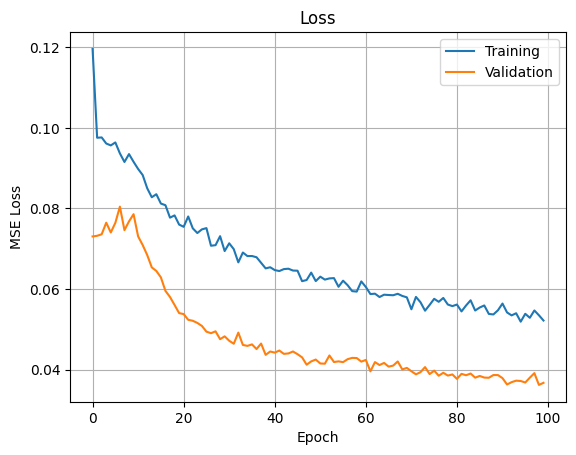

In [167]:
plt.plot(train_losses)
plt.plot(val_losses)
plt.legend(['Training', 'Validation'])
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.grid(True)
plt.show()


Saving model

In [168]:
torch.save(model.state_dict(), 'model_torch.pth')


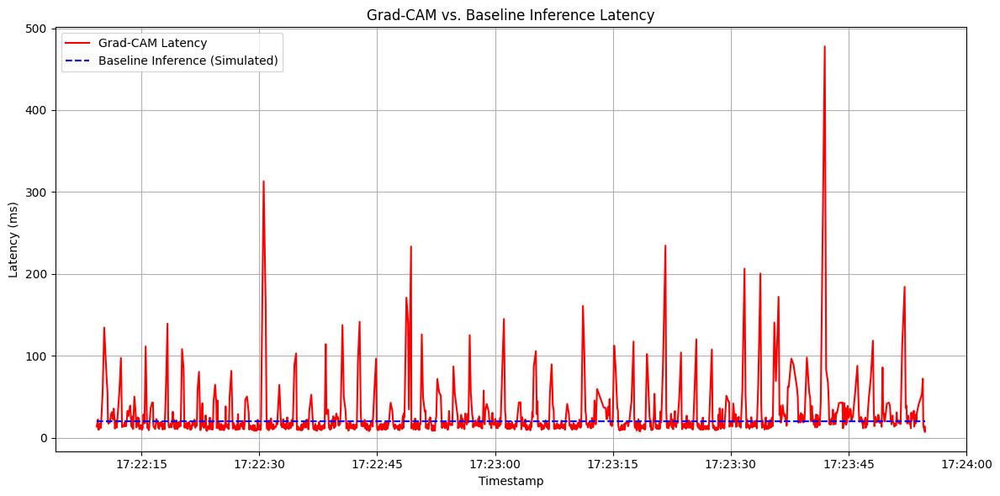

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Load Grad-CAM latency log
gradcam_file = "gradcam_times.csv"

if not os.path.exists(gradcam_file):
    print("File gradcam_times.csv not found.")
    exit()

# Read Grad-CAM latency data
df_cam = pd.read_csv(gradcam_file, names=["timestamp", "gradcam_latency"], skiprows=1)
df_cam["time"] = pd.to_datetime(df_cam["timestamp"], unit='s')

# Simulated baseline latency (example: 20ms per inference)
baseline_latency_ms = 20  # You can change this
df_cam["baseline_latency"] = baseline_latency_ms / 1000  # Convert to seconds

# Plot
plt.figure(figsize=(12, 6))
plt.plot(df_cam["time"], df_cam["gradcam_latency"] * 1000, label="Grad-CAM Latency", color='red')
plt.plot(df_cam["time"], df_cam["baseline_latency"] * 1000, label="Baseline Inference (Simulated)", linestyle='--', color='blue')

plt.title("Grad-CAM vs. Baseline Inference Latency")
plt.xlabel("Timestamp")
plt.ylabel("Latency (ms)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [4]:
import pandas as pd

df = pd.read_csv("gradcam_times.csv")
df["timestamp"] = pd.to_datetime(df["timestamp"], unit="s")
df["latency_ms"] = df["gradcam_latency"] * 1000
df.head()


,timestamp,gradcam_latency,latency_ms
0,2025-08-07 17:22:09.290529280,0.013600,13.600
1,2025-08-07 17:22:09.332446976,0.015480,15.480
2,2025-08-07 17:22:09.374531072,0.017270,17.270
3,2025-08-07 17:22:09.444806400,0.022090,22.090
4,2025-08-07 17:22:09.485793536,0.010519,10.519


In [7]:
import dataframe_image as dfi
dfi.export(df.head(10), "gradcam_log_preview.png")


In [6]:
!pip install dataframe_image


     ---------------------------------------- 6.6/6.6 MB 988.8 kB/s eta 0:00:00
     -------------------------------------- 290.4/290.4 kB 2.6 MB/s eta 0:00:00
     -------------------------------------- 316.4/316.4 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 48.0/48.0 kB 2.5 MB/s eta 0:00:00
     ------------------------------------ 326.9/326.9 kB 844.5 kB/s eta 0:00:00
     ---------------------------------------- 3.8/3.8 MB 1.0 MB/s eta 0:00:00
     -------------------------------------- 399.7/399.7 kB 1.2 MB/s eta 0:00:00
     ------------------------------------ 187.3/187.3 kB 630.1 kB/s eta 0:00:00
     ---------------------------------------- 77.4/77.4 kB 2.2 MB/s eta 0:00:00
     ---------------------------------------- 73.1/73.1 kB 3.9 MB/s eta 0:00:00
     ---------------------------------------- 77.2/77.2 kB 2.2 MB/s eta 0:00:00
     ---------------